In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# -------------------------
# GLOBAL PARAMETERS
# -------------------------
N_moving = 6          # number of moving (active) particles
N_fixed  = 1          # number of fixed (stationary) particles
steps    = 80         # simulation duration
dt       = 0.05       # time step

Lx, Ly = 40.0, 20.0  # box size
v0     = 1            # constant speed for moving particles
mass   = 1.0

a0         = 1        # base particle size
alpha_size = 1

gamma     = 0.05      # anchoring strength (damps y-velocity)
softening = a0        # dipole-force regularisation radius
min_sep   = 2.2 * a0  # minimum allowed separation at initialisation

collision_distance = 1.5 * a0   # distance at which a collision is triggered
theta_c            = np.deg2rad(2)  # head-on angular tolerance
collision_cooldown = 30             # timesteps before re-collision allowed

arrangement = "random"   # "random" or "grid" placement of fixed particles
max_tries   = 10000      # placement attempts before giving up

mu_voltage_list = [10]   # voltage scan (controls nondimensional parameter Π)


In [ ]:
# ─────────────────────────────────────────────
# HELPER FUNCTIONS
# ─────────────────────────────────────────────

def minimum_image(r, Lx, Ly):
    """Apply periodic boundary minimum-image convention to displacement r."""
    r[0] -= Lx * np.round(r[0] / Lx)
    r[1] -= Ly * np.round(r[1] / Ly)
    return r


In [ ]:
def random_nonoverlapping_positions(N, Lx, Ly, min_dist, existing=None, max_tries=10000):
    """
    Place N points randomly inside the box, each at least min_dist
    from every other point (including any pre-existing points).
    """
    if existing is None:
        existing = []

    pos = []
    while len(pos) < N:
        for _ in range(max_tries):
            trial = np.array([
                np.random.uniform(-Lx/2, Lx/2),
                np.random.uniform(-Ly/2, Ly/2)
            ])
            all_so_far = list(existing) + pos
            if all(np.linalg.norm(trial - p) > min_dist for p in all_so_far):
                pos.append(trial)
                break
        else:
            raise RuntimeError("Too dense: reduce N or min_dist")
    return np.array(pos)


def build_system(N_fixed, N_moving, Lx, Ly, arrangement, min_dist, max_tries, v0):
    """
    Create initial positions, dipole moments, velocities, and a fixed_mask.

    fixed_mask[i] = True  → particle i is stationary (fixed dipole)
    fixed_mask[i] = False → particle i is active (moving)

    Fixed particles are placed first so moving particles never overlap them.
    """

    # ── place fixed particles ──────────────────────────────────────────────
    if arrangement == "grid":
        n  = int(np.ceil(np.sqrt(N_fixed)))
        xs = np.linspace(-Lx/2, Lx/2, n)
        ys = np.linspace(-Ly/2, Ly/2, n)
        grid    = [np.array([x, y]) for x in xs for y in ys]
        pos_f   = np.array(grid[:N_fixed])
    elif arrangement == "random":
        pos_f = random_nonoverlapping_positions(N_fixed, Lx, Ly, min_dist,
                                                existing=[], max_tries=max_tries)
    else:
        raise ValueError(f"Unknown arrangement: {arrangement}")

    # fixed dipoles point in random directions and never change
    theta_f = np.random.uniform(0, 2*np.pi, N_fixed)
    mu_f    = np.column_stack((np.cos(theta_f), np.sin(theta_f)))
    vel_f   = np.zeros((N_fixed, 2))   # fixed → zero velocity always

    # ── place moving particles (avoid overlap with fixed ones) ────────────
    pos_m = random_nonoverlapping_positions(N_moving, Lx, Ly, min_dist,
                                            existing=list(pos_f), max_tries=max_tries)
    theta_m = np.random.uniform(0, 2*np.pi, N_moving)
    mu_m    = np.column_stack((np.cos(theta_m), np.sin(theta_m)))
    vel_m   = np.zeros((N_moving, 2))  # will be set to ±x in run_simulation

    # ── stack into single arrays ──────────────────────────────────────────
    # Convention: fixed particles come first (indices 0 … N_fixed-1)
    #             moving particles follow  (indices N_fixed … N_fixed+N_moving-1)
    positions  = np.vstack([pos_f,  pos_m])
    dipoles    = np.vstack([mu_f,   mu_m])
    velocities = np.vstack([vel_f,  vel_m])
    fixed_mask = np.array([True]*N_fixed + [False]*N_moving)

    return positions, dipoles, velocities, fixed_mask


In [ ]:
def dipole_force(r, mu_i, mu_j):
    """
    Dipole-dipole force on particle i due to particle j.
    r  : displacement vector from i to j
    Returns force on i (force on j is the negative).
    """
    rmag = np.linalg.norm(r)
    if rmag < softening:
        return np.zeros(2)

    rhat = r / rmag
    muir = np.dot(mu_i, rhat)
    mujr = np.dot(mu_j, rhat)

    return (1.0 / rmag**4) * (
        muir * mu_j
        + mujr * mu_i
        + (np.dot(mu_i, mu_j) - 5*muir*mujr) * rhat
    )


In [ ]:
def handle_collisions(positions, velocities, fixed_mask, Lx, Ly,
                       t, last_collision,
                       collision_distance, collision_cooldown, theta_c):
    """

      - moving vs moving : head-on collision - distance, anti-parallel
                            velocity, and approaching checks must ALL hold;
                            both particles are pushed apart and reversed.
      - moving vs fixed   : any contact within collision_distance triggers
                            an elastic reflection of the moving particle;
                            the fixed particle never moves.
      - fixed  vs fixed   : skipped - neither particle can move.
    """
    N = len(positions)
    cos_theta_c = np.cos(theta_c)

    for i in range(N):
        for j in range(i + 1, N):

            # fixed-fixed pairs can never collide (neither one moves)
            if fixed_mask[i] and fixed_mask[j]:
                continue

            # cooldown check
            if t - last_collision[i, j] < collision_cooldown:
                continue

            # distance check
            r    = positions[j] - positions[i]
            r    = minimum_image(r, Lx, Ly)
            dist = np.linalg.norm(r)
            if dist < 1e-12 or dist > collision_distance:
                continue

            rhat = r / dist

            if not fixed_mask[i] and not fixed_mask[j]:
                # ── moving vs moving: head-on collision ──────────────────
                vi, vj = velocities[i], velocities[j]

                cos_angle = np.dot(vi, vj) / (np.linalg.norm(vi) * np.linalg.norm(vj))
                if cos_angle > -cos_theta_c:
                    continue                       # not anti-parallel enough
                if np.dot(vj - vi, rhat) >= 0:
                    continue                       # not approaching

                overlap = collision_distance + 1e-3 - dist
                positions[i] -= 0.5 * overlap * rhat
                positions[j] += 0.5 * overlap * rhat

                for k in (i, j):
                    positions[k, 0] = (positions[k, 0] + Lx/2) % Lx - Lx/2
                    positions[k, 1] = (positions[k, 1] + Ly/2) % Ly - Ly/2

                vij = vi - vj
                velocities[i] = vi - np.dot(vij, rhat) * rhat
                velocities[j] = vj + np.dot(vij, rhat) * rhat

            else:
                # ── moving vs fixed: elastic reflection ───────────────────
                if fixed_mask[i]:
                    fixed_pos, moving_idx = positions[i], j
                    # rhat already points fixed(i) -> moving(j)
                else:
                    fixed_pos, moving_idx = positions[j], i
                    rhat = -rhat            # flip so rhat: fixed -> moving

                v = velocities[moving_idx]
                if np.dot(v, rhat) >= 0:
                     continue                # moving away/tangential, not a real collision


                v = velocities[moving_idx].copy()
                velocities[moving_idx] = v - 2 * np.dot(v, rhat) * rhat
                positions[moving_idx]  = fixed_pos + rhat * (collision_distance + 1e-3)

                positions[moving_idx, 0] = (positions[moving_idx, 0] + Lx/2) % Lx - Lx/2
                positions[moving_idx, 1] = (positions[moving_idx, 1] + Ly/2) % Ly - Ly/2

            last_collision[i, j] = t
            last_collision[j, i] = t

In [ ]:
def compute_order_parameter(vel_traj, v0, fixed_mask):
    """Polar order: magnitude of mean velocity direction (moving particles only)."""
    vel_moving = vel_traj[:, ~fixed_mask, :]          # shape (T, N_moving, 2)
    Vsum = np.sum(vel_moving, axis=1)                 # shape (T, 2)
    return np.linalg.norm(Vsum, axis=1) / (np.sum(~fixed_mask) * v0)


def compute_nematic_order(vel_traj, fixed_mask):
    """Nematic order: head-tail symmetry, computed on moving particles only."""
    vel_moving = vel_traj[:, ~fixed_mask, :]
    theta  = np.arctan2(vel_moving[:,:,1], vel_moving[:,:,0])
    Sx = np.sum(np.cos(2 * theta), axis=1)
    Sy = np.sum(np.sin(2 * theta), axis=1)
    return np.sqrt(Sx**2 + Sy**2) / np.sum(~fixed_mask)


In [ ]:
def run_simulation(mu_voltage, N_moving, N_fixed, v0):
    """
    Run one simulation with N_moving active particles and N_fixed stationary ones.

    Key design rules:
    - Fixed particles feel dipole forces FROM moving/fixed neighbours (they exert
      forces on others) but their positions and dipole orientations never change.
    - Moving particles: forces → velocity update → collision → speed rescale
      → position update → dipole update.  Fixed particles skip all of these.
    - Order parameters are computed on moving particles only.
    """

    # ── initialise ────────────────────────────────────────────────────────
    positions, dipoles, velocities, fixed_mask = build_system(
        N_fixed, N_moving, Lx, Ly, arrangement, min_sep, max_tries, v0
    )
    N = len(positions)                           # N_fixed + N_moving

    sizes   = a0 * np.ones(N)
    dipoles = mu_voltage * sizes[:, None] * dipoles   # scale by voltage & size

    # moving particles start along ±x
    velocities[~fixed_mask, 0] = np.random.choice([-1, 1], size=N_moving) * v0
    velocities[~fixed_mask, 1] = 0.0

    last_collision = -np.ones((N, N), dtype=int)

    # ── storage ───────────────────────────────────────────────────────────
    traj        = np.zeros((steps+1, N, 2))
    vel_traj    = np.zeros((steps+1, N, 2))
    dipole_traj = np.zeros((steps+1, N, 2))

    traj[0]        = positions.copy()
    vel_traj[0]    = velocities.copy()
    dipole_traj[0] = dipoles.copy()

    # ── time loop ─────────────────────────────────────────────────────────
    for t in range(1, steps+1):

        # 1. Dipole-dipole forces — computed for ALL pairs (fixed + moving)
        #    Fixed particles are force sources for the movers; their own
        #    position never changes so we only write forces onto movers.
        forces = np.zeros((N, 2))
        for i in range(N):
            for j in range(i+1, N):
                r = positions[j] - positions[i]
                r = minimum_image(r, Lx, Ly)
                F = dipole_force(r, dipoles[i], dipoles[j])
                forces[i] -= F
                forces[j] += F

        # 2. Anchoring (restoring) force — moving particles only
        #    Damps y-velocity to encourage lane-like motion along x
        forces[~fixed_mask, 1] += -gamma * sizes[~fixed_mask] * velocities[~fixed_mask, 1]

        # 3. Velocity update — moving particles only
        velocities[~fixed_mask] += (forces[~fixed_mask] / mass) * dt

        # 4. Collisions -- moving-moving AND moving-fixed are now resolved
        #    together in ONE pass over every pair (handle_collisions), the
        #    same way the dipole-force loop handles every pair in one pass.
        handle_collisions(
            positions, velocities, fixed_mask,
            Lx, Ly, t, last_collision,
            collision_distance, collision_cooldown, theta_c
        )

        # 5. Speed rescaling — keep every moving particle at exactly v0
        speeds = np.linalg.norm(velocities[~fixed_mask], axis=1, keepdims=True)
        speeds = np.where(speeds < 1e-8, 1.0, speeds)
        velocities[~fixed_mask] = v0 * velocities[~fixed_mask] / speeds

        # 6. Position update — moving particles only (Euler step)
        positions[~fixed_mask] += velocities[~fixed_mask] * dt
        positions[~fixed_mask, 0] = (positions[~fixed_mask, 0] + Lx/2) % Lx - Lx/2
        positions[~fixed_mask, 1] = (positions[~fixed_mask, 1] + Ly/2) % Ly - Ly/2

        # 7. Size and dipole update — moving particles only
        #    Fixed dipoles retain their initial orientation forever
        tilt               = np.abs(velocities[~fixed_mask, 1]) / v0
        sizes[~fixed_mask] = a0 * (1 + alpha_size * tilt)
        dirs = velocities[~fixed_mask] / np.linalg.norm(
                   velocities[~fixed_mask], axis=1, keepdims=True)
        dipoles[~fixed_mask] = mu_voltage * sizes[~fixed_mask, None] * dirs

        # 8. Store snapshot
        traj[t]        = positions.copy()
        vel_traj[t]    = velocities.copy()
        dipole_traj[t] = dipoles.copy()

    return traj, vel_traj, dipole_traj, fixed_mask


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 119978 (\N{MATHEMATICAL SCRIPT CAPITAL O}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


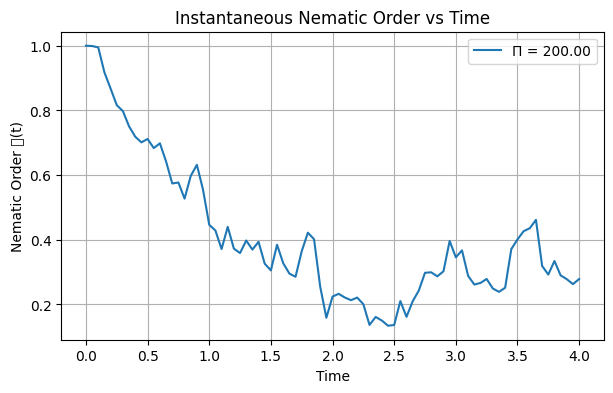

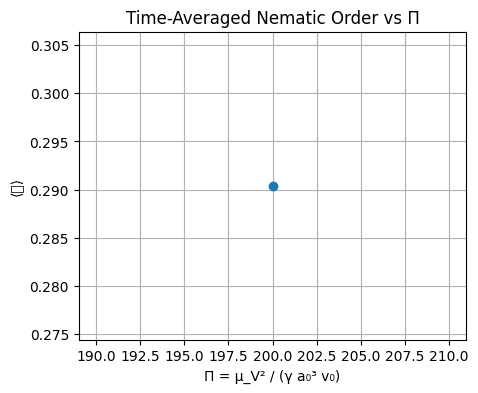

In [ ]:
order_results = {}
Pi_values     = []
fixed_mask_store = None

for muV in mu_voltage_list:
    v    = v0 * muV
    Pi   = muV**2 / (gamma * a0**3 * v)
    Pi_values.append(Pi)
    N_muV = 7 * muV    # particle count scales with voltage; adjust as needed

    traj, vel_traj, dipole_traj, fixed_mask_store = run_simulation(muV, N_muV, N_fixed, v)

    # order computed on moving particles only
    order_results[Pi] = compute_nematic_order(vel_traj, fixed_mask_store)

time = np.arange(steps+1) * dt

plt.figure(figsize=(7, 4))
for Pi, order in order_results.items():
    plt.plot(time, order, label=f"Π = {Pi:.2f}")
plt.xlabel("Time")
plt.ylabel("Nematic Order 𝒪(t)")
plt.title("Instantaneous Nematic Order vs Time")
plt.legend()
plt.grid(True)
plt.show()

t_start  = int(0.3 * steps)
avg_order = [np.mean(order_results[Pi][t_start:]) for Pi in Pi_values]

plt.figure(figsize=(5, 4))
plt.plot(Pi_values, avg_order, 'o-', lw=2)
plt.xlabel("Π = μ_V² / (γ a₀³ v₀)")
plt.ylabel("⟨𝒪⟩")
plt.title("Time-Averaged Nematic Order vs Π")
plt.grid(True)
plt.show()


In [ ]:
# ─────────────────────────────────────────────────────
# VISUALISATION
# Fixed particles → red squares
# Moving particles → blue circles
# Arrows show dipole direction for all particles
# ─────────────────────────────────────────────────────

arrow_gain = 5.0

Pi_vis          = 400
mu_voltage_vis  = np.sqrt(Pi_vis * gamma * a0**3 * v0)
print(f"Visualising Π = {Pi_vis:.3f}  →  μ_V = {mu_voltage_vis:.3f}")

steps   = 300
N_t     = 20
v0_vis  = v0 * mu_voltage_vis

traj_vis, vel_traj_vis, dipole_traj_vis, fixed_mask_vis = run_simulation(
    mu_voltage_vis, N_t, N_fixed, v0_vis
)

from matplotlib.animation import FuncAnimation
import matplotlib as mpl
mpl.rcParams['animation.html'] = 'jshtml'

fig, ax = plt.subplots(figsize=(8, 4))
ax.set_xlim(-Lx/2, Lx/2)
ax.set_ylim(-Ly/2, Ly/2)
ax.set_aspect('equal')
ax.set_title(f"Simulation at Π = {Pi_vis:.2f}  |  blue = moving, red = fixed")

# separate scatter objects so fixed and moving get different colours/markers
scat_moving = ax.scatter([], [], s=70,  c='tab:blue', marker='o', zorder=3)
scat_fixed  = ax.scatter([], [], s=120, c='tab:red',  marker='s', zorder=3)

quiv = ax.quiver(
    traj_vis[0, :, 0], traj_vis[0, :, 1],
    arrow_gain * dipole_traj_vis[0, :, 0],
    arrow_gain * dipole_traj_vis[0, :, 1],
    angles='xy', scale_units='xy', scale=None, width=0.008, color='k'
)

# particle-index labels
labels = []
for i in range(traj_vis.shape[1]):
    colour = 'white' if not fixed_mask_vis[i] else 'yellow'
    txt = ax.text(traj_vis[0, i, 0], traj_vis[0, i, 1], str(i),
                  fontsize=8, color=colour, ha='center', va='center', zorder=4)
    labels.append(txt)

def update(frame):
    pos = traj_vis[frame]

    scat_moving.set_offsets(pos[~fixed_mask_vis])
    scat_fixed.set_offsets(pos[fixed_mask_vis])

    quiv.set_offsets(pos)
    quiv.set_UVC(
        arrow_gain * dipole_traj_vis[frame, :, 0],
        arrow_gain * dipole_traj_vis[frame, :, 1]
    )

    for i, txt in enumerate(labels):
        txt.set_position((pos[i, 0], pos[i, 1]))

    return scat_moving, scat_fixed, quiv, *labels

ani = FuncAnimation(fig, update, frames=len(traj_vis), interval=40, blit=False)
plt.close(fig)
ani


Visualising Π = 400.000  →  μ_V = 4.472


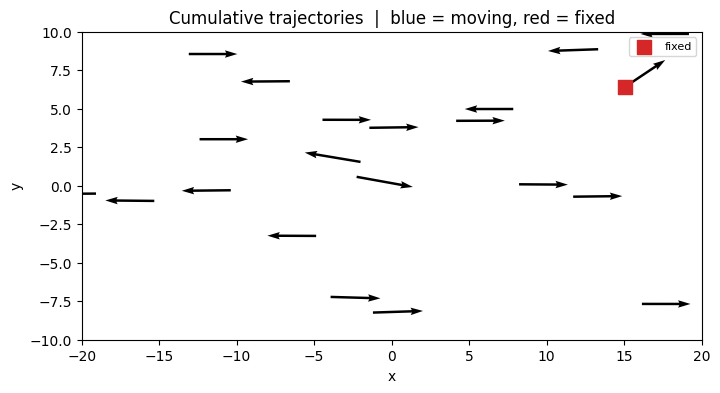

In [ ]:
import matplotlib.animation as animation

def plot_cumulative_trajectories(traj, dipole_traj, fixed_mask,
                                 Lx, Ly, ignore_steps=0,
                                 save_video=False, filename="trajectories.mp4",
                                 fps=20, dipole_scale=0.5):
    """
    Animate cumulative trajectories with dipole arrows.
    Fixed particles are shown as red squares with stationary trails.
    Moving particles are shown as blue circles with coloured trails.
    """
    T, N, _ = traj.shape

    fig, ax = plt.subplots(figsize=(8, 4))
    ax.set_xlim(-Lx/2, Lx/2)
    ax.set_ylim(-Ly/2, Ly/2)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_title("Cumulative trajectories  |  blue = moving, red = fixed")

    # one line per particle (fixed particles will just be a dot)
    lines    = []
    segments = [[] for _ in range(N)]
    for i in range(N):
        colour = 'tab:blue' if not fixed_mask[i] else 'tab:red'
        line, = ax.plot([], [], lw=1, color=colour)
        lines.append(line)

    quiver = ax.quiver(
        traj[ignore_steps, :, 0], traj[ignore_steps, :, 1],
        dipole_traj[ignore_steps, :, 0], dipole_traj[ignore_steps, :, 1],
        angles='xy', scale_units='xy', scale=1.0/dipole_scale,
        width=0.004, color='k'
    )

    # mark fixed particles permanently
    ax.scatter(traj[0, fixed_mask, 0], traj[0, fixed_mask, 1],
               s=100, c='tab:red', marker='s', zorder=5, label='fixed')
    ax.legend(loc='upper right', fontsize=8)

    def init():
        for line in lines:
            line.set_data([], [])
        return lines + [quiver]

    def update_frame(frame):
        t = frame + ignore_steps
        for i in range(N):
            if t == ignore_steps:
                segments[i] = [traj[t, i]]
            else:
                dx = traj[t, i, 0] - traj[t-1, i, 0]
                dy = traj[t, i, 1] - traj[t-1, i, 1]
                if abs(dx) > Lx/2 or abs(dy) > Ly/2:
                    segments[i] = [traj[t, i]]   # restart segment after wrap
                else:
                    segments[i].append(traj[t, i])

            seg = np.array(segments[i])
            if len(seg) > 1:
                lines[i].set_data(seg[:, 0], seg[:, 1])

        mu = dipole_traj[t]
        norms = np.linalg.norm(mu, axis=1, keepdims=True)
        norms = np.where(norms < 1e-8, 1.0, norms)
        mu_norm = mu / norms

        quiver.set_offsets(traj[t])
        quiver.set_UVC(mu_norm[:, 0], mu_norm[:, 1])
        return lines + [quiver]

    ani = animation.FuncAnimation(
        fig, update_frame, frames=T - ignore_steps,
        init_func=init, blit=True, interval=1000/fps
    )

    if save_video:
        print(f"Saving to {filename}")
        writer = 'pillow' if filename.endswith('.gif') else 'ffmpeg'
        ani.save(filename, writer=writer, fps=fps)

    plt.show()


plot_cumulative_trajectories(
    traj_vis, dipole_traj_vis, fixed_mask_vis,
    Lx, Ly,
    ignore_steps=10,
    save_video=False,
    dipole_scale=0.7
)


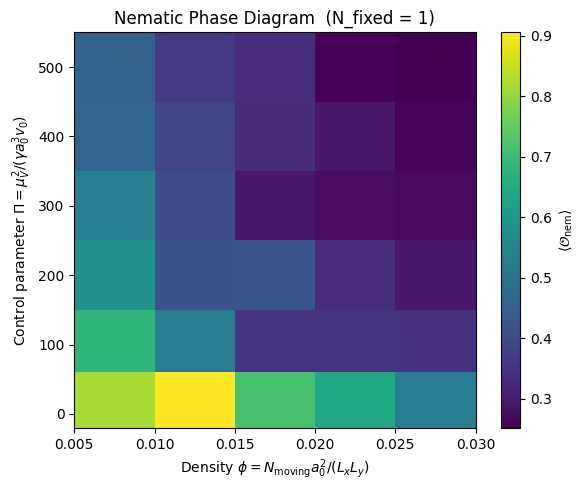

In [ ]:
from openpyxl import Workbook

# PHASE DIAGRAM SCAN  (Π vs density φ)
N_list         = [6, 10, 14, 18, 22]
mu_voltage_list_scan = [1, 5, 10, 15, 20, 25]
n_seeds        = 5
t_start_frac   = 0.4
steps          = 600

phi_values = np.array([N * a0**2 / (Lx * Ly) for N in N_list])
Pi_scan    = []
order_map  = np.zeros((len(mu_voltage_list_scan), len(N_list)))
order_std  = np.zeros_like(order_map)

for i_mu, muV in enumerate(mu_voltage_list_scan):
    v  = v0 * muV
    Pi = muV**2 / (gamma * a0**3 * v)
    Pi_scan.append(Pi)

    for j_N, Np in enumerate(N_list):
        ensemble = []
        for seed in range(n_seeds):
            np.random.seed(seed)
            traj_s, vel_s, dip_s, fmask_s = run_simulation(muV, Np, N_fixed, v)
            nem = compute_nematic_order(vel_s, fmask_s)
            t0  = int(t_start_frac * len(nem))
            ensemble.append(np.mean(nem[t0:]))

        order_map[i_mu, j_N] = np.mean(ensemble)
        order_std[i_mu, j_N] = np.std(ensemble)

Pi_scan = np.array(Pi_scan)

# save to Excel
wb = Workbook()
ws = wb.active
ws.title = "NematicOrder"
ws.cell(1, 1, "Pi \\ Phi")
for j, phi in enumerate(phi_values):
    ws.cell(1, j+2, phi)
for i, Pi in enumerate(Pi_scan):
    ws.cell(i+2, 1, Pi)
    for j in range(len(phi_values)):
        ws.cell(i+2, j+2, order_map[i, j])

ws2 = wb.create_sheet("StdDev")
ws2.cell(1, 1, "Pi \\ Phi")
for j, phi in enumerate(phi_values):
    ws2.cell(1, j+2, phi)
for i, Pi in enumerate(Pi_scan):
    ws2.cell(i+2, 1, Pi)
    for j in range(len(phi_values)):
        ws2.cell(i+2, j+2, order_std[i, j])

wb.save("nematic_phase_diagram_with_fixed.xlsx")

# plot
X, Y = np.meshgrid(phi_values, Pi_scan)
plt.figure(figsize=(6, 5))
pcm = plt.pcolormesh(X, Y, order_map, shading='nearest', cmap='viridis')
plt.colorbar(pcm, label=r'$\langle \mathcal{O}_{\mathrm{nem}} \rangle$')
plt.xlabel(r'Density $\phi = N_{\mathrm{moving}} a_0^2 / (L_x L_y)$')
plt.ylabel(r'Control parameter $\Pi = \mu_V^2 / (\gamma a_0^3 v_0)$')
plt.title(f"Nematic Phase Diagram  (N_fixed = {N_fixed})")
plt.tight_layout()
plt.show()
